In [1]:
# Install evaluation metrics
!pip install -q pycocoevalcap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 7.6 MB/s eta 0:00:00


In [2]:
import pickle
import json
import os
import nltk
from PIL import Image
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [3]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Categorical
import numpy as np
import time
import os
import sys
from tqdm import tqdm

# First, install pycocoevalcap if needed
!pip install -q pycocoevalcap

# Define the paths
PROJECT_DIR = '/content/drive/MyDrive/image_captioning_project_transformer_new'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load your vocabulary and model classes
sys.path.append(PROJECT_DIR)  # Add project directory to path

# Define the Vocabulary class if not already imported
class Vocabulary:
    def __init__(self):
        self.word2idx = {}
        self.idx2word = {}
        self.idx = 0

    def add_word(self, word):
        if word not in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1

    def __call__(self, word):
        if word not in self.word2idx:
            return self.word2idx['<unk>']
        return self.word2idx[word]

    def __len__(self):
        return len(self.word2idx)

# Load vocabulary
with open(f'{PROJECT_DIR}/data/vocab.pkl', 'rb') as f:
    transformer_vocab = pickle.load(f)

# Import your model classes
# EncoderCNNTransformer, TransformerDecoder, etc.
# This should match your model definitions from your training code

# Import network definitions for your transformer model
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=50):
        super(PositionalEncoding, self).__init__()

        # Create positional encoding
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))

        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)

        self.register_buffer('pe', pe)

    def forward(self, x):
        return x + self.pe[:, :x.size(1)]

class EncoderCNNTransformer(nn.Module):
    def __init__(self, embed_size=512):
        super(EncoderCNNTransformer, self).__init__()

        # Load pre-trained ResNet
        resnet = torch.hub.load('pytorch/vision:v0.10.0', 'resnet101', pretrained=True)

        # Remove final linear and pooling layers
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Add projection layer to get the required embedding size
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.linear = nn.Linear(2048, embed_size)
        self.dropout = nn.Dropout(0.5)
        self.bn = nn.BatchNorm1d(embed_size)

        # Fine-tune only the last convolutional block
        for param in list(self.resnet.parameters())[:-36]:  # freeze earlier layers
            param.requires_grad = False

    def forward(self, images):
        # Extract features from ResNet
        features = self.resnet(images)  # [batch_size, 2048, h/32, w/32]
        features = self.adaptive_pool(features)  # [batch_size, 2048, 1, 1]
        features = features.view(features.size(0), -1)  # [batch_size, 2048]

        # Project to embedding size
        features = self.linear(features)  # [batch_size, embed_size]
        features = self.bn(features)
        features = self.dropout(features)

        return features

class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, embed_size, hidden_size, num_layers=4, num_heads=8, dropout=0.3, max_length=50):
        super(TransformerDecoder, self).__init__()

        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.vocab_size = vocab_size
        self.max_length = max_length

        # Word embedding
        self.embedding = nn.Embedding(vocab_size, embed_size)

        # Positional encoding
        self.positional_encoding = PositionalEncoding(embed_size, max_length)

        # Add dropout and layer normalization
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(embed_size)

        # Transformer decoder layer
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=embed_size,
            nhead=num_heads,
            dim_feedforward=hidden_size,
            dropout=dropout,
            batch_first=True
        )

        # Transformer decoder
        self.transformer_decoder = nn.TransformerDecoder(
            decoder_layer=decoder_layer,
            num_layers=num_layers
        )

        # Output layer
        self.fc = nn.Linear(embed_size, vocab_size)

        # Initialize weights
        self.init_weights()

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def generate_mask(self, size):
        """Generate a square mask for the sequence."""
        mask = torch.triu(torch.ones(size, size), diagonal=1).bool()
        return mask

    def forward(self, encoder_out, captions):
        # Embed captions
        embeddings = self.embedding(captions)  # [batch_size, seq_len, embed_size]

        # Add positional encoding
        embeddings = self.positional_encoding(embeddings)  # [batch_size, seq_len, embed_size]

        # Apply dropout and layer normalization
        embeddings = self.dropout(embeddings)
        embeddings = self.layer_norm(embeddings)

        # Create masks
        tgt_mask = self.generate_mask(captions.size(1)).to(captions.device)
        tgt_padding_mask = (captions == 0).to(captions.device)  # [batch_size, seq_len]

        # Reshape encoder output for memory
        memory = encoder_out.unsqueeze(1)  # [batch_size, 1, embed_size]

        # Pass through transformer decoder
        output = self.transformer_decoder(
            tgt=embeddings,
            memory=memory,
            tgt_mask=tgt_mask,
            tgt_key_padding_mask=tgt_padding_mask
        )  # [batch_size, seq_len, embed_size]

        # Project to vocabulary size
        outputs = self.fc(output)  # [batch_size, seq_len, vocab_size]

        return outputs

    def sample(self, encoder_out, start_token=1, end_token=2, max_len=20):
        """Generate captions for given image features using greedy search."""
        batch_size = encoder_out.size(0)

        # Start with start token
        input_seq = torch.ones(batch_size, 1).long().to(encoder_out.device) * start_token

        # Storage for output predictions
        outputs = []

        # Generate caption iteratively
        for i in range(max_len):
            # Get predictions for current sequence
            preds = self.forward(encoder_out, input_seq)

            # Get next word prediction (last token in sequence)
            next_word_logits = preds[:, -1, :]
            next_word = next_word_logits.argmax(dim=1, keepdim=True)

            # Add predicted word to output
            outputs.append(next_word)

            # Concatenate with input sequence
            input_seq = torch.cat([input_seq, next_word], dim=1)

            # Break if all sequences have end token
            if (next_word == end_token).all():
                break

        # Concatenate all predictions
        outputs = torch.cat(outputs, dim=1)

        return outputs

class TransformerCaptioner(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=4, max_length=50):
        super(TransformerCaptioner, self).__init__()

        self.encoder = EncoderCNNTransformer(embed_size)
        self.decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embed_size=embed_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            max_length=max_length
        )

    def forward(self, images, captions):
        encoder_out = self.encoder(images)
        outputs = self.decoder(encoder_out, captions)
        return outputs

    def sample(self, images, max_len=20):
        encoder_out = self.encoder(images)
        sampled_ids = self.decoder.sample(encoder_out, max_len=max_len)
        return sampled_ids

# Initialize the transformer model
import math
import pickle

transformer_model = TransformerCaptioner(
    embed_size=512,
    hidden_size=2048,
    vocab_size=len(transformer_vocab),
    num_layers=4,
    max_length=50
).to(device)

# Load the pre-trained model
model_path = f'{PROJECT_DIR}/models/best_model.pth'
checkpoint = torch.load(model_path, map_location=device)
transformer_model.load_state_dict(checkpoint['model'])
print("Pre-trained transformer model loaded successfully.")

# Create your data loader
# This should match your training data loader setup
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# Define your dataset class
class COCODataset(Dataset):
    def __init__(self, image_dir, image_ids, image_id_to_captions, vocab, transform=None, max_length=50):
        # Implementation of your dataset class
        self.image_dir = image_dir
        self.image_id_to_filename = {}
        self.data = []
        self.max_length = max_length

        # Load image_id to filename mapping
        with open(f'{PROJECT_DIR}/data/annotations/captions_train2017.json', 'r') as f:
            coco_data = json.load(f)

        for img in coco_data['images']:
            if img['id'] in image_ids:
                self.image_id_to_filename[img['id']] = img['file_name']

        # Create data entries: (image_id, caption)
        for img_id in image_ids:
            if img_id in image_id_to_captions:
                for caption in image_id_to_captions[img_id]:
                    self.data.append((img_id, caption))

        self.vocab = vocab
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Implementation of getting an item
        img_id, caption = self.data[idx]
        img_filename = self.image_id_to_filename[img_id]
        img_path = os.path.join(self.image_dir, img_filename)

        # Load and transform image
        image = Image.open(img_path).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)

        # Process caption
        tokens = nltk.tokenize.word_tokenize(caption.lower())
        caption = []
        caption.append(self.vocab('<start>'))
        caption.extend([self.vocab(token) for token in tokens])
        caption.append(self.vocab('<end>'))

        # Pad or truncate caption to fixed length
        if len(caption) > self.max_length:
            caption = caption[:self.max_length]
        else:
            padding = [self.vocab('<pad>')] * (self.max_length - len(caption))
            caption.extend(padding)

        return image, torch.tensor(caption), img_id

# Create a smaller subset for RL training (it's compute intensive)
import json
import nltk

# Load selected image IDs
with open(f'{PROJECT_DIR}/data/selected_image_ids.pkl', 'rb') as f:
    selected_image_ids = pickle.load(f)

# Load image_id_to_captions
with open(f'{PROJECT_DIR}/data/image_id_to_captions.pkl', 'rb') as f:
    image_id_to_captions = pickle.load(f)

# Use a smaller subset for RL (300 images should be enough for fine-tuning)
rl_train_ids = list(selected_image_ids)[:300]

# Define transforms
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create dataset for RL training
rl_dataset = COCODataset(
    image_dir=f'{PROJECT_DIR}/data/train2017',
    image_ids=rl_train_ids,
    image_id_to_captions=image_id_to_captions,
    vocab=transformer_vocab,
    transform=transform,
    max_length=50
)

# Create data loader with smaller batch size for RL
def collate_fn(data):
    images, captions, img_ids = zip(*data)
    images = torch.stack(images, 0)
    captions = torch.stack(captions, 0)
    return images, captions, img_ids

rl_train_loader = DataLoader(
    rl_dataset,
    batch_size=16,  # Smaller batch size for RL
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn
)

print(f"RL training dataset created with {len(rl_dataset)} samples.")

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Categorical
import numpy as np
from collections import defaultdict
import time
from PIL import Image
import nltk
import re

# Make sure NLTK is installed and punkt tokenizer is downloaded
nltk.download('punkt')

# Custom CIDEr-like reward function
def compute_cider_reward(hypothesis, references):
    """
    Compute a simplified CIDEr-like reward

    Args:
        hypothesis (str): Generated caption
        references (list): List of reference captions

    Returns:
        float: Reward score
    """
    # Tokenize and clean
    def process_text(text):
        text = text.lower()
        text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
        return nltk.word_tokenize(text)

    hyp_tokens = process_text(hypothesis)

    # TF-IDF-like weighting
    document_frequency = defaultdict(float)

    # For each reference, count document frequency
    for reference in references:
        ref_tokens = process_text(reference)
        unique_tokens = set(ref_tokens)
        for token in unique_tokens:
            document_frequency[token] += 1

    # Number of references
    n_refs = len(references)

    # Calculate IDF weights: log(N/(df + 1))
    idf_weights = {token: np.log(n_refs / (df + 1)) for token, df in document_frequency.items()}

    # Calculate similarity for each reference
    similarities = []

    for reference in references:
        ref_tokens = process_text(reference)

        # Skip empty captions
        if not hyp_tokens or not ref_tokens:
            similarities.append(0)
            continue

        # Calculate TF vectors
        hyp_counts = defaultdict(float)
        ref_counts = defaultdict(float)

        for token in hyp_tokens:
            hyp_counts[token] += 1

        for token in ref_tokens:
            ref_counts[token] += 1

        # Normalize TF vectors
        hyp_len = len(hyp_tokens)
        ref_len = len(ref_tokens)

        for token in hyp_counts:
            hyp_counts[token] /= hyp_len

        for token in ref_counts:
            ref_counts[token] /= ref_len

        # Calculate TF-IDF vectors
        hyp_tfidf = {token: count * idf_weights.get(token, 0) for token, count in hyp_counts.items()}
        ref_tfidf = {token: count * idf_weights.get(token, 0) for token, count in ref_counts.items()}

        # Calculate cosine similarity
        # Find tokens in both
        common_tokens = set(hyp_tfidf.keys()) & set(ref_tfidf.keys())

        # Calculate dot product
        dot_product = sum(hyp_tfidf[token] * ref_tfidf[token] for token in common_tokens)

        # Calculate magnitudes
        hyp_magnitude = np.sqrt(sum(v**2 for v in hyp_tfidf.values()))
        ref_magnitude = np.sqrt(sum(v**2 for v in ref_tfidf.values()))

        # Calculate cosine similarity
        if hyp_magnitude * ref_magnitude == 0:
            similarities.append(0)
        else:
            similarities.append(dot_product / (hyp_magnitude * ref_magnitude))

    # Average the similarities
    if not similarities:
        return 0
    return 10 * np.mean(similarities)  # Scale to 0-10 range like CIDEr

# Simplified RL Training function
def train_with_rl(model, train_loader, vocab, device, num_epochs=2):
    # Set to training mode
    model.train()

    # Use a lower learning rate for fine-tuning
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-6)

    print("Starting Reinforcement Learning training...")

    for epoch in range(num_epochs):
        epoch_rewards = []
        epoch_loss = 0

        start_time = time.time()

        for batch_idx, (images, captions, img_ids) in enumerate(train_loader):
            images = images.to(device)
            captions = captions.to(device)

            batch_size = images.size(0)

            # Step 1: Get reference captions
            reference_captions = []
            for i in range(batch_size):
                # Extract reference caption from ground truth
                ref_caption = []
                for word_id in captions[i, 1:]:  # Skip start token
                    word = vocab.idx2word[word_id.item()]
                    if word == '<end>':
                        break
                    if word not in ['<pad>']:
                        ref_caption.append(word)

                reference_captions.append([' '.join(ref_caption)])

            # Step 2: Generate greedy caption (baseline)
            model.eval()
            with torch.no_grad():
                encoder_out = model.encoder(images)
                greedy_caps = model.decoder.sample(encoder_out)

            # Convert to text
            greedy_captions = []
            for i in range(batch_size):
                greedy_caption = []
                for word_id in greedy_caps[i]:
                    word = vocab.idx2word[word_id.item()]
                    if word == '<end>':
                        break
                    if word not in ['<start>', '<pad>']:
                        greedy_caption.append(word)
                greedy_captions.append(' '.join(greedy_caption))

            # Step 3: Generate sampled captions using policy
            model.train()
            encoder_out = model.encoder(images)

            # Initialize with start token
            curr_tokens = torch.ones(batch_size, 1).long().to(device) * vocab('<start>')
            log_probs = []
            sampled_tokens = []

            # Generate caption word by word
            for step in range(30):  # Max length
                # Get predictions
                outputs = model.decoder(encoder_out, curr_tokens)

                # Get logits for the last token
                logits = outputs[:, -1, :]

                # Sample from distribution
                probs = F.softmax(logits, dim=-1)
                dist = Categorical(probs)
                sampled_token = dist.sample()

                # Get log probability
                log_prob = dist.log_prob(sampled_token)
                log_probs.append(log_prob)

                # Add to sampled tokens
                sampled_tokens.append(sampled_token.unsqueeze(1))

                # Update current tokens
                curr_tokens = torch.cat([curr_tokens, sampled_token.unsqueeze(1)], dim=1)

                # Check if all sequences ended
                if (sampled_token == vocab('<end>')).all():
                    break

            # Convert sample to text
            sample_captions = []
            for i in range(batch_size):
                sample_caption = []
                for step, token_batch in enumerate(sampled_tokens):
                    word = vocab.idx2word[token_batch[i].item()]
                    if word == '<end>':
                        break
                    if word not in ['<start>', '<pad>']:
                        sample_caption.append(word)
                sample_captions.append(' '.join(sample_caption))

            # Step 4: Calculate rewards using custom CIDEr
            rewards = []
            for i in range(batch_size):
                # Calculate reward for this caption
                reward = compute_cider_reward(sample_captions[i], reference_captions[i])
                baseline = compute_cider_reward(greedy_captions[i], reference_captions[i])

                # Use advantage (reward - baseline)
                advantage = reward - baseline
                rewards.append(advantage)
                epoch_rewards.append(advantage)

            rewards = torch.FloatTensor(rewards).to(device)

            # Step 5: Calculate RL loss
            log_probs = torch.stack(log_probs, 1)

            # Create mask for variable length sequences
            mask = torch.ones_like(log_probs)
            for i, tokens in enumerate(sampled_tokens):
                for j in range(batch_size):
                    if tokens[j].item() == vocab('<end>'):
                        mask[j, i:] = 0
                        break

            # Calculate loss
            rl_loss = -torch.sum(log_probs * rewards.unsqueeze(1) * mask) / torch.sum(mask)

            # Backward and optimize
            optimizer.zero_grad()
            rl_loss.backward()

            # Clip gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)

            optimizer.step()

            epoch_loss += rl_loss.item()

            # Print status
            if batch_idx % 5 == 0:
                print(f"Epoch: {epoch+1}/{num_epochs} | Batch: {batch_idx}/{len(train_loader)} | "
                      f"Loss: {rl_loss.item():.4f} | Reward: {rewards.mean().item():.4f}")

        # End of epoch
        elapsed_time = time.time() - start_time
        print(f"Epoch {epoch+1}/{num_epochs} completed in {elapsed_time/60:.2f} minutes")
        print(f"Average Loss: {epoch_loss/len(train_loader):.4f} | Average Reward: {np.mean(epoch_rewards):.4f}")

        # Save model
        torch.save({
            'model': model.state_dict(),
            'epoch': epoch,
        }, f'{PROJECT_DIR}/models/rl_model_epoch{epoch}.pth')

    # Save final model
    torch.save({
        'model': model.state_dict(),
    }, f'{PROJECT_DIR}/models/rl_model_final.pth')

    print("RL training completed!")
    return model

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [9]:
# Now you can run the RL training
import nltk
nltk.download('punkt_tab')
rl_trained_model = train_with_rl(transformer_model, rl_train_loader, transformer_vocab, device, num_epochs=2)

print("RL training complete!")

Starting Reinforcement Learning training...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Epoch: 1/2 | Batch: 0/94 | Loss: -3.3176 | Reward: -1.3068
Epoch: 1/2 | Batch: 5/94 | Loss: -1.0756 | Reward: -0.5929
Epoch: 1/2 | Batch: 10/94 | Loss: -2.4640 | Reward: -0.9401
Epoch: 1/2 | Batch: 15/94 | Loss: -0.9338 | Reward: -0.5413
Epoch: 1/2 | Batch: 20/94 | Loss: -2.4964 | Reward: -1.0005
Epoch: 1/2 | Batch: 25/94 | Loss: -1.6742 | Reward: -0.5751
Epoch: 1/2 | Batch: 30/94 | Loss: -2.2966 | Reward: -1.0401
Epoch: 1/2 | Batch: 35/94 | Loss: -0.1484 | Reward: -0.0112
Epoch: 1/2 | Batch: 40/94 | Loss: -2.6700 | Reward: -0.9913
Epoch: 1/2 | Batch: 45/94 | Loss: -1.6937 | Reward: -0.4681
Epoch: 1/2 | Batch: 50/94 | Loss: -1.1939 | Reward: -0.2165
Epoch: 1/2 | Batch: 55/94 | Loss: -2.6723 | Reward: -0.9435
Epoch: 1/2 | Batch: 60/94 | Loss: -0.9225 | Reward: -0.4383
Epoch: 1/2 | Batch: 65/94 | Loss: -1.3196 | Reward: -0.4374
Epoch: 1/2 | Batch: 70/94 | Loss: -0.1786 | Reward: -0.1009
Epoch: 1/2 | Batch: 75/94 | Loss: -5.5678 | Reward: -1.8548
Epoch: 1/2 | Batch: 80/94 | Loss: -0.9146 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Using device: cuda


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Models loaded successfully

=== Testing on Internet Images ===


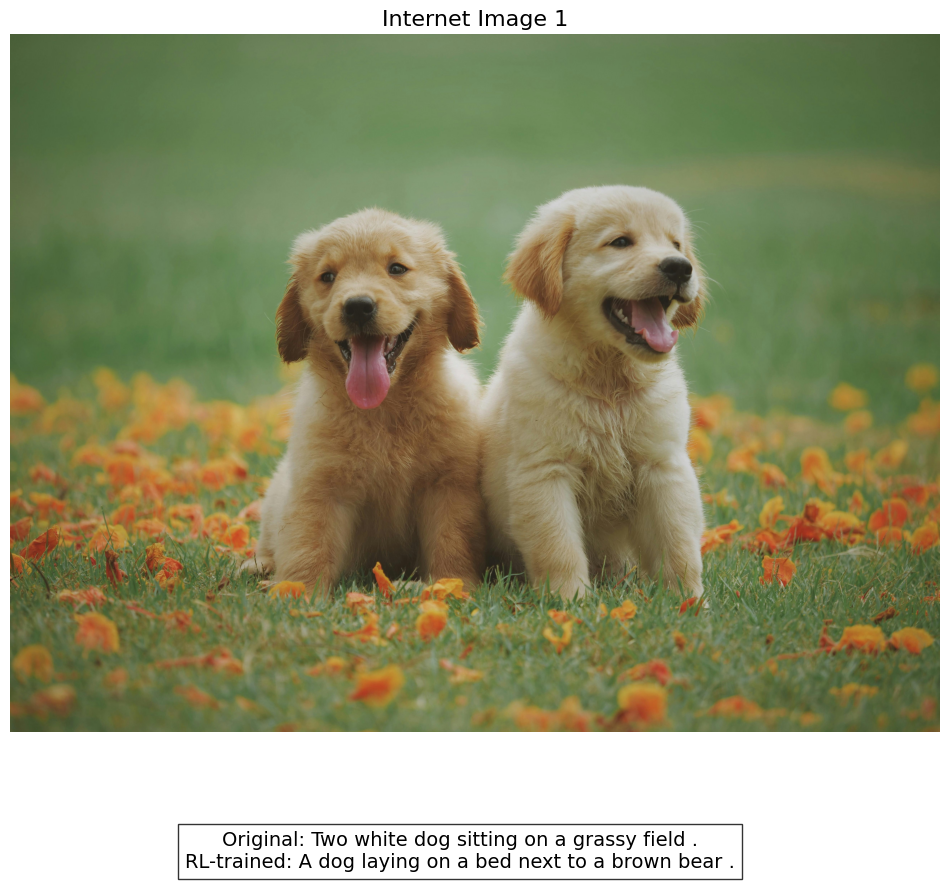

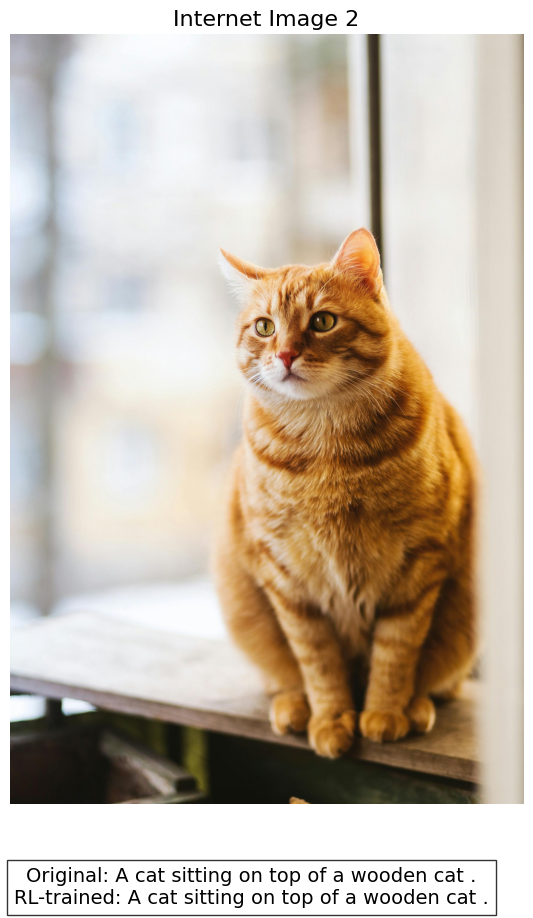

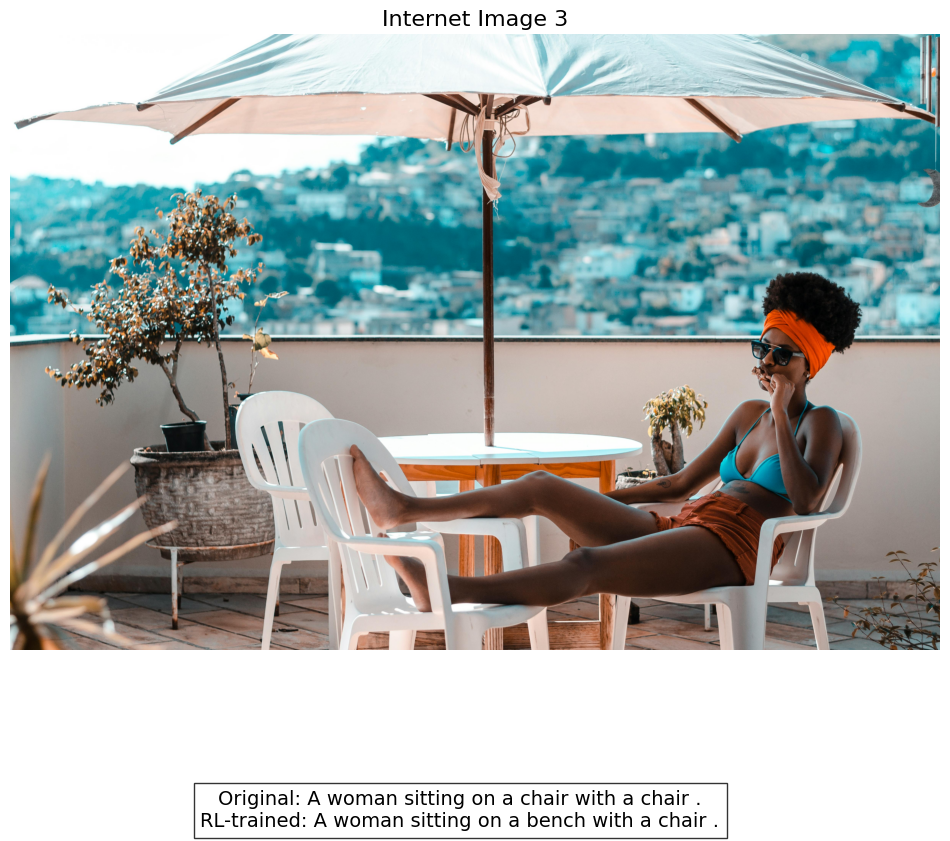

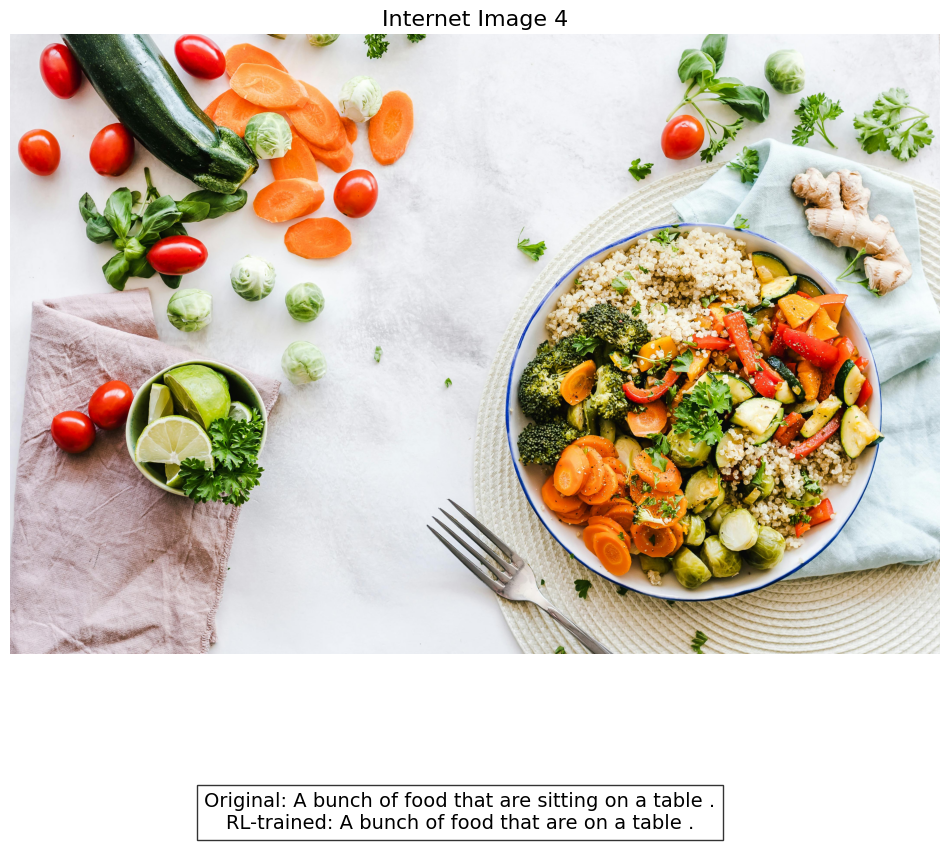

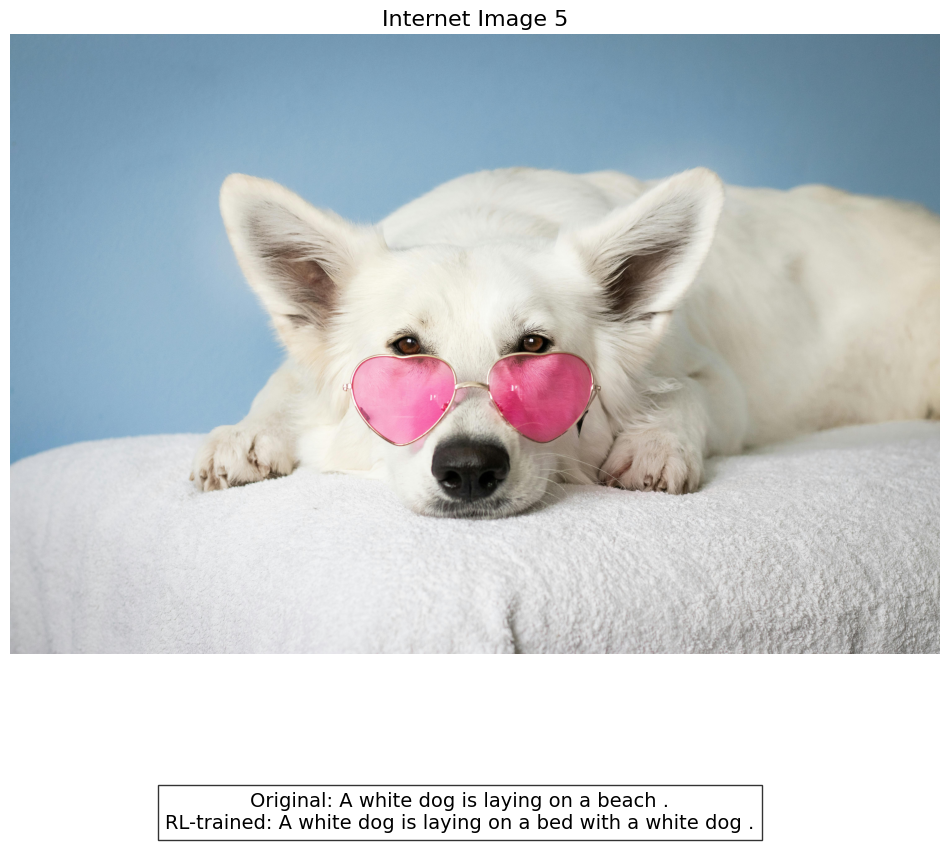


=== Testing on COCO Dataset Images ===


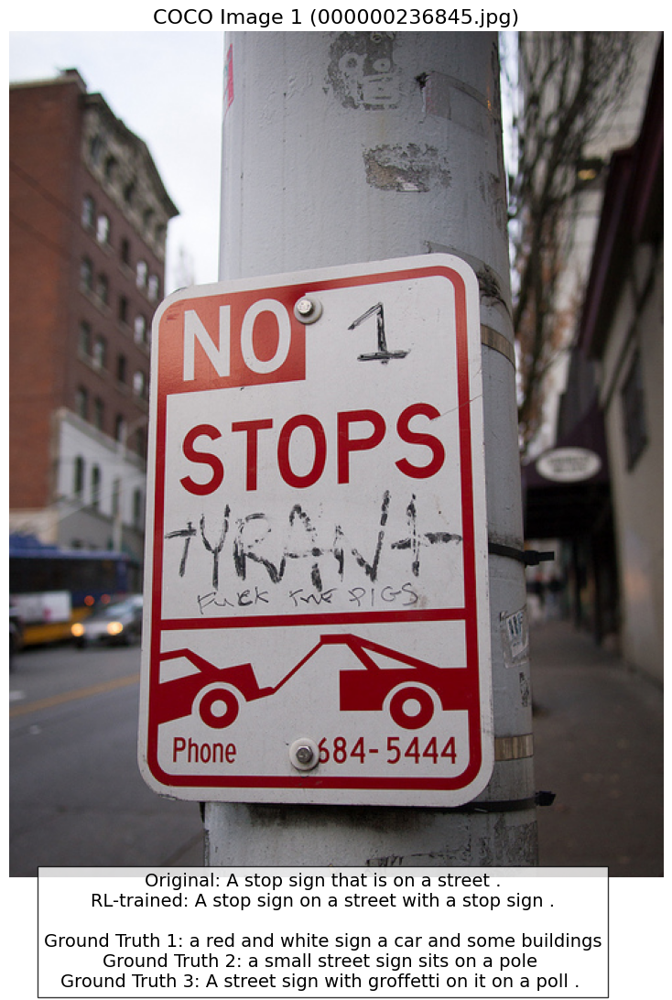

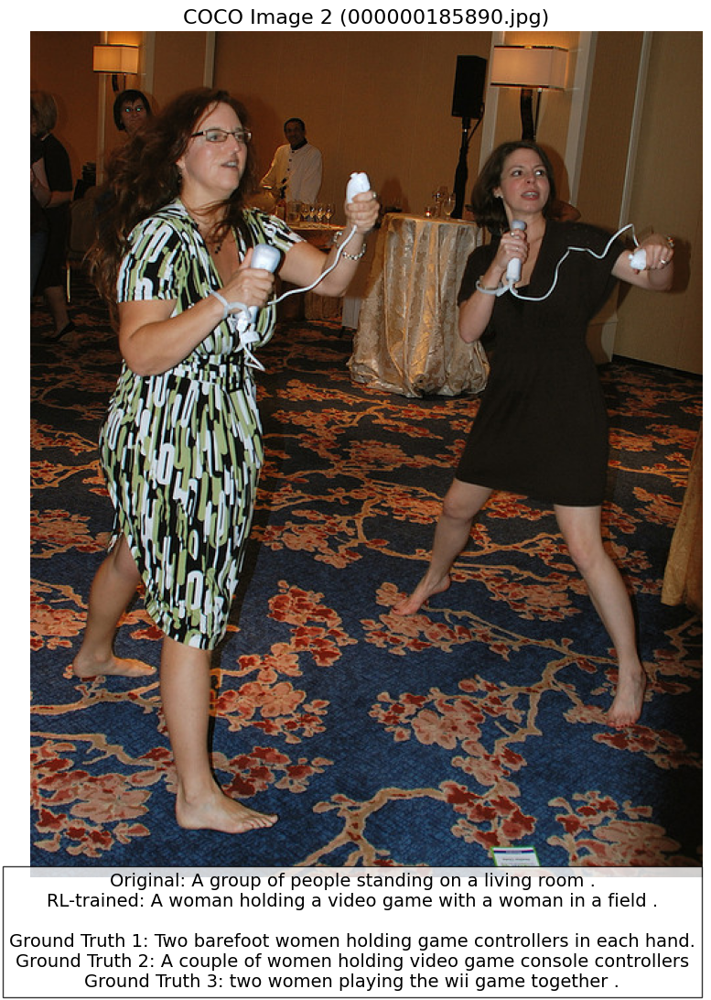

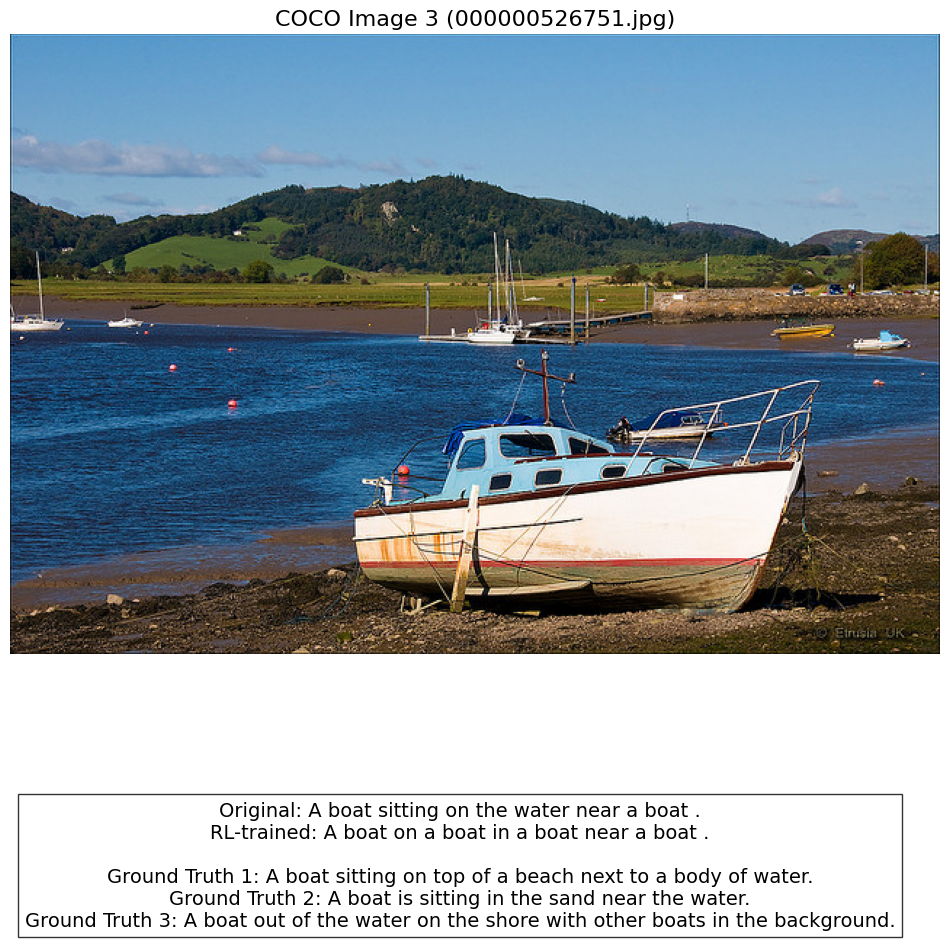

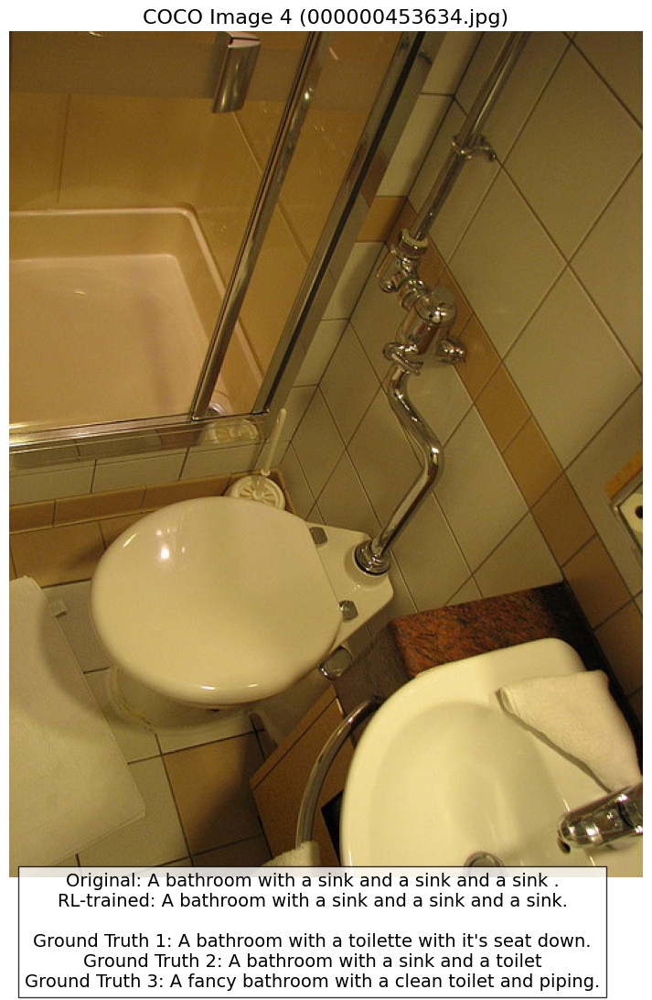

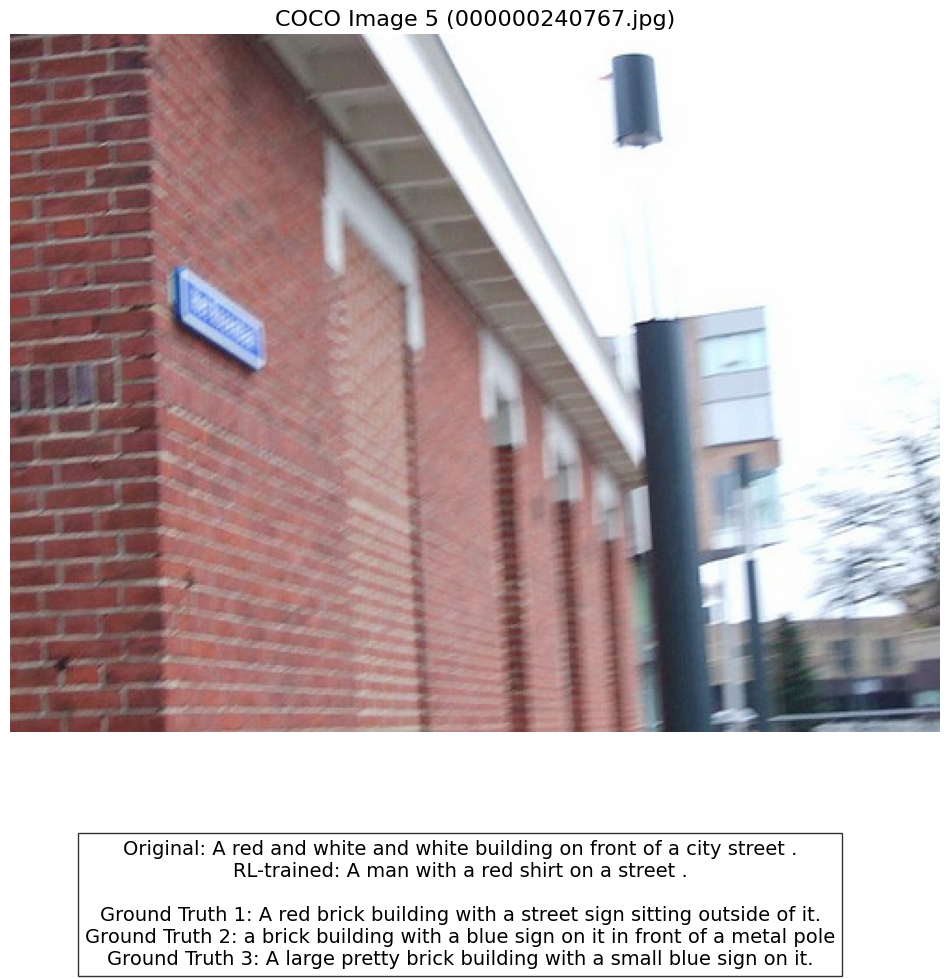


=== Calculating Metrics for Original Model ===

=== Calculating Metrics on 50 COCO Images ===


Evaluating: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]



=== Calculating Metrics for RL-Trained Model ===

=== Calculating Metrics on 50 COCO Images ===


Evaluating: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]


=== Metrics Comparison ===

Metric     | Original Model  | RL Model        | Improvement    
-----------------------------------------------------------------
BLEU-1     | 0.5159          | 0.4515          | -12.50%        
BLEU-2     | 0.3826          | 0.3227          | -15.65%        
BLEU-3     | 0.2549          | 0.2248          | -11.81%        
BLEU-4     | 0.1524          | 0.1536          | +0.80%         

=== Caption Similarity Analysis ===

Internet Images:
Internet Image 1: Word Overlap: 0.2667, Bigram Match: 0.0556, Trigram Match: 0.0000
Internet Image 2: Word Overlap: 1.0000, Bigram Match: 1.0000, Trigram Match: 1.0000
Internet Image 3: Word Overlap: 0.8750, Bigram Match: 0.7000, Trigram Match: 0.4545
Internet Image 4: Word Overlap: 0.9000, Bigram Match: 0.7273, Trigram Match: 0.5455
Internet Image 5: Word Overlap: 0.7000, Bigram Match: 0.5000, Trigram Match: 0.4167
Average Internet Image Word Overlap: 0.7483

COCO Images:
COCO Image 1: Word Overlap: 0.6667, RL-GT Overl

In [16]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import os
import random
import json
import numpy as np
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm
import nltk

# Ensure NLTK data is available
nltk.download('punkt')

# Setup directories
PROJECT_DIR = '/content/drive/MyDrive/image_captioning_project_transformer_new'
COMPARISON_DIR = '/content/drive/MyDrive/rl_model_evaluation'
os.makedirs(COMPARISON_DIR, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load the models directly from the module

# Load vocabulary
import pickle
with open(f'{PROJECT_DIR}/data/vocab.pkl', 'rb') as f:
    vocab = pickle.load(f)

# Create model instances
original_model = TransformerCaptioner(
    embed_size=512,
    hidden_size=2048,
    vocab_size=len(vocab),
    num_layers=4,
    max_length=50
).to(device)

rl_model = TransformerCaptioner(
    embed_size=512,
    hidden_size=2048,
    vocab_size=len(vocab),
    num_layers=4,
    max_length=50
).to(device)

# Load state dicts
original_checkpoint = torch.load(f'{PROJECT_DIR}/models/best_model.pth', map_location=device)
rl_checkpoint = torch.load(f'{PROJECT_DIR}/models/rl_model_final.pth', map_location=device)

# Extract state dicts
if 'model' in original_checkpoint:
    original_model.load_state_dict(original_checkpoint['model'])
else:
    original_model.load_state_dict(original_checkpoint)

if 'model' in rl_checkpoint:
    rl_model.load_state_dict(rl_checkpoint['model'])
else:
    rl_model.load_state_dict(rl_checkpoint)

print("Models loaded successfully")

# Define image preprocessing
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Caption generation function
def generate_caption(model, image):
    # Preprocess image
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Set model to evaluation mode
    model.eval()

    # Generate caption
    with torch.no_grad():
        sampled_ids = model.sample(image_tensor)
        sampled_ids = sampled_ids[0].cpu().numpy()

    # Convert word IDs to words
    sampled_caption = []
    for word_id in sampled_ids:
        word = vocab.idx2word[word_id]
        if word == '<end>':
            break
        if word not in ['<start>', '<pad>']:
            sampled_caption.append(word)

    # Join words to form sentence
    sentence = ' '.join(sampled_caption)
    sentence = sentence.capitalize()
    if not sentence.endswith('.'):
        sentence += '.'

    return sentence

# Test on internet images
def test_on_internet_images():
    print("\n=== Testing on Internet Images ===")

    image_urls = [
        "https://images.pexels.com/photos/1108099/pexels-photo-1108099.jpeg",  # dog
        "https://images.pexels.com/photos/1170986/pexels-photo-1170986.jpeg",  # people on beach
        "https://images.pexels.com/photos/1154638/pexels-photo-1154638.jpeg",  # bicycle
        "https://images.pexels.com/photos/1640777/pexels-photo-1640777.jpeg",  # pizza
        "https://images.pexels.com/photos/2607544/pexels-photo-2607544.jpeg",  # downtown city
    ]

    results = []

    for i, url in enumerate(image_urls):
        try:
            # Download image
            response = requests.get(url)
            image = Image.open(BytesIO(response.content)).convert('RGB')

            # Generate captions with both models
            original_caption = generate_caption(original_model, image)
            rl_caption = generate_caption(rl_model, image)

            # Save results
            results.append({
                'Image': f"Internet Image {i+1}",
                'Original Caption': original_caption,
                'RL Caption': rl_caption
            })

            # Save image
            image_path = os.path.join(COMPARISON_DIR, f"internet_image_{i+1}.jpg")
            image.save(image_path)

            # Display image with captions
            plt.figure(figsize=(12, 10))
            plt.imshow(image)
            plt.title(f"Internet Image {i+1}", fontsize=16)
            plt.axis('off')
            plt.figtext(0.5, 0.01,
                       f"Original: {original_caption}\nRL-trained: {rl_caption}",
                       ha="center", fontsize=14,
                       bbox={"facecolor":"white", "alpha":0.8, "pad":5})
            plt.savefig(os.path.join(COMPARISON_DIR, f"internet_comparison_{i+1}.jpg"), bbox_inches='tight')
            plt.show()

        except Exception as e:
            print(f"Error processing internet image {i+1}: {e}")

    return results

# Test on COCO dataset images
def test_on_coco_images():
    print("\n=== Testing on COCO Dataset Images ===")

    # Get paths to COCO validation images
    val_dir = f'{PROJECT_DIR}/data/val2017'
    if not os.path.exists(val_dir) or len(os.listdir(val_dir)) == 0:
        print("COCO validation images not found.")
        return []

    # Load validation annotations to get ground truth captions
    try:
        val_annotations_path = f'{PROJECT_DIR}/data/annotations/captions_val2017.json'
        with open(val_annotations_path, 'r') as f:
            val_data = json.load(f)

        # Create mappings
        img_id_to_filename = {}
        img_id_to_captions = {}

        for img in val_data['images']:
            img_id_to_filename[img['id']] = img['file_name']

        for ann in val_data['annotations']:
            if ann['image_id'] not in img_id_to_captions:
                img_id_to_captions[ann['image_id']] = []
            img_id_to_captions[ann['image_id']].append(ann['caption'])

        # Get all available image files
        available_files = os.listdir(val_dir)

        # Find image IDs that have files and captions
        valid_img_ids = []
        for img_id, filename in img_id_to_filename.items():
            if filename in available_files and img_id in img_id_to_captions:
                valid_img_ids.append(img_id)

        # Select 5 random images
        num_images = 5
        if len(valid_img_ids) > num_images:
            selected_img_ids = random.sample(valid_img_ids, num_images)
        else:
            selected_img_ids = valid_img_ids
            print(f"Only {len(selected_img_ids)} valid COCO images available")

        results = []

        for i, img_id in enumerate(selected_img_ids):
            try:
                # Load image
                filename = img_id_to_filename[img_id]
                img_path = os.path.join(val_dir, filename)
                image = Image.open(img_path).convert('RGB')

                # Generate captions
                original_caption = generate_caption(original_model, image)
                rl_caption = generate_caption(rl_model, image)

                # Get ground truth captions
                ground_truth = img_id_to_captions[img_id]

                # Save results
                results.append({
                    'Image': f"COCO Image {i+1}",
                    'Filename': filename,
                    'Original Caption': original_caption,
                    'RL Caption': rl_caption,
                    'Ground Truth': ground_truth[:3]  # Take first 3 ground truth captions
                })

                # Copy image
                dest_path = os.path.join(COMPARISON_DIR, f"coco_image_{i+1}.jpg")
                image.save(dest_path)

                # Display image with captions
                plt.figure(figsize=(12, 12))
                plt.imshow(image)
                plt.title(f"COCO Image {i+1} ({filename})", fontsize=16)
                plt.axis('off')

                # Format ground truth captions
                gt_text = "\n".join([f"Ground Truth {j+1}: {gt}" for j, gt in enumerate(ground_truth[:3])])

                plt.figtext(0.5, 0.01,
                          f"Original: {original_caption}\nRL-trained: {rl_caption}\n\n{gt_text}",
                          ha="center", fontsize=14,
                          bbox={"facecolor":"white", "alpha":0.8, "pad":5})
                plt.savefig(os.path.join(COMPARISON_DIR, f"coco_comparison_{i+1}.jpg"), bbox_inches='tight')
                plt.show()

            except Exception as e:
                print(f"Error processing COCO image {img_id}: {e}")

        return results

    except Exception as e:
        print(f"Error loading COCO annotations: {e}")
        return []

# Calculate evaluation metrics on a larger set of validation images
def calculate_metrics(model, num_samples=100):
    print(f"\n=== Calculating Metrics on {num_samples} COCO Images ===")

    # Get paths to COCO validation images
    val_dir = f'{PROJECT_DIR}/data/val2017'
    if not os.path.exists(val_dir) or len(os.listdir(val_dir)) == 0:
        print("COCO validation images not found.")
        return None

    # Load validation annotations
    val_annotations_path = f'{PROJECT_DIR}/data/annotations/captions_val2017.json'
    with open(val_annotations_path, 'r') as f:
        val_data = json.load(f)

    # Create mappings
    img_id_to_filename = {}
    img_id_to_captions = {}

    for img in val_data['images']:
        img_id_to_filename[img['id']] = img['file_name']

    for ann in val_data['annotations']:
        if ann['image_id'] not in img_id_to_captions:
            img_id_to_captions[ann['image_id']] = []
        img_id_to_captions[ann['image_id']].append(ann['caption'])

    # Get available images
    available_files = os.listdir(val_dir)

    # Find valid image IDs
    valid_img_ids = []
    for img_id, filename in img_id_to_filename.items():
        if filename in available_files and img_id in img_id_to_captions:
            valid_img_ids.append(img_id)

    # Select random subset
    if len(valid_img_ids) > num_samples:
        selected_img_ids = random.sample(valid_img_ids, num_samples)
    else:
        selected_img_ids = valid_img_ids
        print(f"Only {len(selected_img_ids)} valid COCO images available")

    # Set model to evaluation mode
    model.eval()

    # Generate captions and calculate scores
    references = []
    hypotheses = []

    for img_id in tqdm(selected_img_ids, desc="Evaluating"):
        try:
            filename = img_id_to_filename[img_id]
            img_path = os.path.join(val_dir, filename)

            # Load and process image
            image = Image.open(img_path).convert('RGB')
            image_tensor = transform(image).unsqueeze(0).to(device)

            # Generate caption
            with torch.no_grad():
                sampled_ids = model.sample(image_tensor)
                sampled_ids = sampled_ids[0].cpu().numpy()

            # Convert to words
            predicted_caption = []
            for word_id in sampled_ids:
                word = vocab.idx2word[word_id]
                if word == '<end>':
                    break
                if word not in ['<start>', '<pad>']:
                    predicted_caption.append(word)

            # Get reference captions
            refs = img_id_to_captions[img_id]

            # Add to evaluation sets
            references.append([ref.split() for ref in refs])
            hypotheses.append(predicted_caption)

        except Exception as e:
            print(f"Error processing image {filename}: {e}")

    # Calculate BLEU scores
    bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
    bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0))
    bleu3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0))
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    return {
        'BLEU-1': bleu1,
        'BLEU-2': bleu2,
        'BLEU-3': bleu3,
        'BLEU-4': bleu4,
        'Num_Images': len(references)
    }

# Custom similarity metrics for captions
def calculate_similarity_metrics(caption1, caption2):
    # Tokenize captions
    tokens1 = nltk.word_tokenize(caption1.lower())
    tokens2 = nltk.word_tokenize(caption2.lower())

    # Calculate word overlap (Jaccard similarity)
    set1 = set(tokens1)
    set2 = set(tokens2)

    if not set1 or not set2:
        return 0, 0, 0

    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    jaccard = intersection / union

    # Calculate exact n-gram matches
    bigram_match = 0
    trigram_match = 0

    if len(tokens1) >= 2 and len(tokens2) >= 2:
        bigrams1 = set(zip(tokens1[:-1], tokens1[1:]))
        bigrams2 = set(zip(tokens2[:-1], tokens2[1:]))
        if bigrams1 and bigrams2:
            bigram_match = len(bigrams1.intersection(bigrams2)) / len(bigrams1.union(bigrams2))

    if len(tokens1) >= 3 and len(tokens2) >= 3:
        trigrams1 = set(zip(tokens1[:-2], tokens1[1:-1], tokens1[2:]))
        trigrams2 = set(zip(tokens2[:-2], tokens2[1:-1], tokens2[2:]))
        if trigrams1 and trigrams2:
            trigram_match = len(trigrams1.intersection(trigrams2)) / len(trigrams1.union(trigrams2))

    return jaccard, bigram_match, trigram_match

# Run tests and metrics
# 1. Test on internet images
internet_results = test_on_internet_images()

# 2. Test on COCO images
coco_results = test_on_coco_images()

# 3. Calculate metrics for both models
print("\n=== Calculating Metrics for Original Model ===")
original_metrics = calculate_metrics(original_model, num_samples=50)

print("\n=== Calculating Metrics for RL-Trained Model ===")
rl_metrics = calculate_metrics(rl_model, num_samples=50)

# 4. Calculate similarity between captions from the two models
similarity_results = []

# For internet images
for result in internet_results:
    jaccard, bigram, trigram = calculate_similarity_metrics(
        result['Original Caption'],
        result['RL Caption']
    )

    similarity_results.append({
        'Image': result['Image'],
        'Word Overlap': jaccard,
        'Bigram Match': bigram,
        'Trigram Match': trigram
    })

# For COCO images
for result in coco_results:
    jaccard, bigram, trigram = calculate_similarity_metrics(
        result['Original Caption'],
        result['RL Caption']
    )

    # Also calculate against ground truth
    gt_jaccard = np.mean([
        calculate_similarity_metrics(result['RL Caption'], gt)[0]
        for gt in result['Ground Truth']
    ])

    original_gt_jaccard = np.mean([
        calculate_similarity_metrics(result['Original Caption'], gt)[0]
        for gt in result['Ground Truth']
    ])

    similarity_results.append({
        'Image': result['Image'],
        'Word Overlap': jaccard,
        'Bigram Match': bigram,
        'Trigram Match': trigram,
        'RL-GT Overlap': gt_jaccard,
        'Original-GT Overlap': original_gt_jaccard
    })

# Print metrics comparison
if original_metrics and rl_metrics:
    print("\n=== Metrics Comparison ===\n")
    print(f"{'Metric':<10} | {'Original Model':<15} | {'RL Model':<15} | {'Improvement':<15}")
    print("-" * 65)

    for metric in original_metrics:
        if metric in rl_metrics and metric != 'Num_Images':
            original_value = original_metrics[metric]
            rl_value = rl_metrics[metric]

            if rl_value > original_value:
                improvement = f"+{((rl_value - original_value) / original_value) * 100:.2f}%"
            else:
                improvement = f"{((rl_value - original_value) / original_value) * 100:.2f}%"

            print(f"{metric:<10} | {original_value:.4f}{'':>9} | {rl_value:.4f}{'':>9} | {improvement:<15}")

# Print similarity results
print("\n=== Caption Similarity Analysis ===\n")
print("Internet Images:")
avg_internet_overlap = 0
for result in similarity_results[:len(internet_results)]:
    print(f"{result['Image']}: Word Overlap: {result['Word Overlap']:.4f}, Bigram Match: {result['Bigram Match']:.4f}, Trigram Match: {result['Trigram Match']:.4f}")
    avg_internet_overlap += result['Word Overlap']

if len(internet_results) > 0:
    avg_internet_overlap /= len(internet_results)
    print(f"Average Internet Image Word Overlap: {avg_internet_overlap:.4f}")

print("\nCOCO Images:")
avg_coco_overlap = 0
avg_rl_gt = 0
avg_orig_gt = 0
coco_similarity = similarity_results[len(internet_results):]

for result in coco_similarity:
    print(f"{result['Image']}: Word Overlap: {result['Word Overlap']:.4f}, RL-GT Overlap: {result['RL-GT Overlap']:.4f}, Original-GT Overlap: {result['Original-GT Overlap']:.4f}")
    avg_coco_overlap += result['Word Overlap']
    avg_rl_gt += result['RL-GT Overlap']
    avg_orig_gt += result['Original-GT Overlap']

if len(coco_results) > 0:
    avg_coco_overlap /= len(coco_results)
    avg_rl_gt /= len(coco_results)
    avg_orig_gt /= len(coco_results)

    print(f"Average COCO Image Word Overlap: {avg_coco_overlap:.4f}")
    print(f"Average RL-Ground Truth Overlap: {avg_rl_gt:.4f}")
    print(f"Average Original-Ground Truth Overlap: {avg_orig_gt:.4f}")

    if avg_rl_gt > avg_orig_gt:
        print(f"RL model is closer to ground truth by {((avg_rl_gt - avg_orig_gt) / avg_orig_gt) * 100:.2f}%")
    else:
        print(f"Original model is closer to ground truth by {((avg_orig_gt - avg_rl_gt) / avg_rl_gt) * 100:.2f}%")

# Print the caption comparison summary
print("\n=== Caption Comparison Summary ===\n")

print("Internet Images:")
for r in internet_results:
    print(f"{r['Image']}:")
    print(f"Original: {r['Original Caption']}")
    print(f"RL-trained: {r['RL Caption']}")
    print()

print("\nCOCO Dataset Images:")
for r in coco_results:
    print(f"{r['Image']} ({r['Filename']}):")
    print(f"Original: {r['Original Caption']}")
    print(f"RL-trained: {r['RL Caption']}")
    print("Ground Truth:")
    for i, gt in enumerate(r['Ground Truth']):
        print(f"  {i+1}. {gt}")
    print()

# Save all results
with open(os.path.join(COMPARISON_DIR, 'evaluation_results.txt'), 'w') as f:
    f.write("=== Metrics Comparison ===\n\n")
    f.write(f"{'Metric':<10} | {'Original Model':<15} | {'RL Model':<15} | {'Improvement':<15}\n")
    f.write("-" * 65 + "\n")

    if original_metrics and rl_metrics:
        for metric in original_metrics:
            if metric in rl_metrics and metric != 'Num_Images':
                original_value = original_metrics[metric]
                rl_value = rl_metrics[metric]

                if rl_value > original_value:
                    improvement = f"+{((rl_value - original_value) / original_value) * 100:.2f}%"
                else:
                    improvement = f"{((rl_value - original_value) / original_value) * 100:.2f}%"

                f.write(f"{metric:<10} | {original_value:.4f}{'':>9} | {rl_value:.4f}{'':>9} | {improvement:<15}\n")

    f.write("\n\n=== Caption Similarity Analysis ===\n\n")
    f.write("Internet Images:\n")
    for result in similarity_results[:len(internet_results)]:
        f.write(f"{result['Image']}: Word Overlap: {result['Word Overlap']:.4f}, Bigram Match: {result['Bigram Match']:.4f}, Trigram Match: {result['Trigram Match']:.4f}\n")

    if len(internet_results) > 0:
        f.write(f"Average Internet Image Word Overlap: {avg_internet_overlap:.4f}\n")

    f.write("\nCOCO Images:\n")
    for result in coco_similarity:
        f.write(f"{result['Image']}: Word Overlap: {result['Word Overlap']:.4f}, RL-GT Overlap: {result['RL-GT Overlap']:.4f}, Original-GT Overlap: {result['Original-GT Overlap']:.4f}\n")

    if len(coco_results) > 0:
        f.write(f"Average COCO Image Word Overlap: {avg_coco_overlap:.4f}\n")
        f.write(f"Average RL-Ground Truth Overlap: {avg_rl_gt:.4f}\n")
        f.write(f"Average Original-Ground Truth Overlap: {avg_orig_gt:.4f}\n")

        if avg_rl_gt > avg_orig_gt:
            f.write(f"RL model is closer to ground truth by {((avg_rl_gt - avg_orig_gt) / avg_orig_gt) * 100:.2f}%\n")
        else:
            f.write(f"Original model is closer to ground truth by {((avg_orig_gt - avg_rl_gt) / avg_rl_gt) * 100:.2f}%\n")

    f.write("\n\n=== Caption Comparison Summary ===\n\n")

    f.write("Internet Images:\n")
    for r in internet_results:
        f.write(f"{r['Image']}:\n")
        f.write(f"Original: {r['Original Caption']}\n")
        f.write(f"RL-trained: {r['RL Caption']}\n\n")

    f.write("\nCOCO Dataset Images:\n")
    for r in coco_results:
        f.write(f"{r['Image']} ({r['Filename']}):\n")
        f.write(f"Original: {r['Original Caption']}\n")
        f.write(f"RL-trained: {r['RL Caption']}\n")
        f.write("Ground Truth:\n")
        for i, gt in enumerate(r['Ground Truth']):
            f.write(f"  {i+1}. {gt}\n")
        f.write("\n")

print(f"\nAll evaluation results saved to {COMPARISON_DIR}/evaluation_results.txt")